## Business Statistics
### Assignment 01

Group 7, Team Members:
* Carl Hümbs
* Dide Uzun
* Gino Krijnen
* Matthijs Snijders

# **Research Question:**
### *How do various factors influence the housing market in a specific area?*

## **1. Preparing data for analysis**

### **1.1 Loading the dataset into the python file and importing all needed libraries**

In [215]:
# importing the libraries that are needed to perform the code and functions in this file
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import folium
import statsmodels.api as sm
import seaborn as sns


# Loading our dataset into our jupyter notebook. We have uploaded it to github to ensure that every team member always accesses the same file.
housing_df = pd.read_csv ('https://raw.githubusercontent.com/GinoKrijnen/Sub-Assignment-1/main/Housing.csv')

### **1.2 Cleaning**

Dropping all rows with empty values

In [216]:
# Dropping all the rows with missing values right away
housing_df.dropna(inplace=True)

#Having a first look at the data
housing_df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


Checking how the main variable, the *dependent variable* is distributed. Therefore, we are plotting the data.

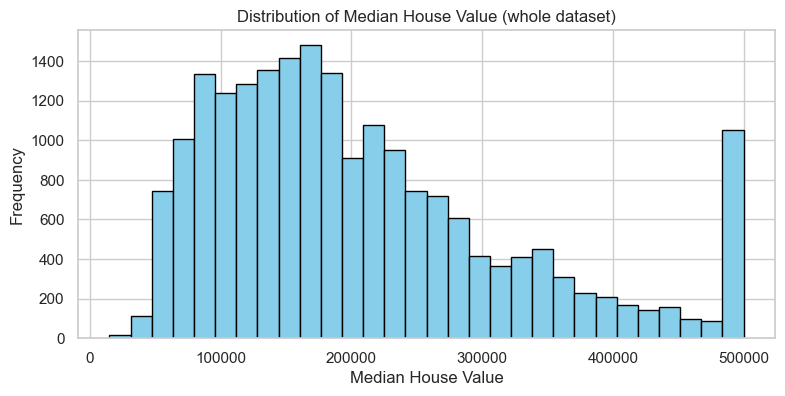

In [217]:
plt.figure(figsize=(9, 4))  # Set the size of the figure

# Plot a bar chart for the distribution of median_house_value
plt.hist(housing_df['median_house_value'], bins=30, color='skyblue', edgecolor='black')

plt.xlabel('Median House Value')
plt.ylabel('Frequency')
plt.title('Distribution of Median House Value (whole dataset)')
plt.grid(True)

# Show the plot
plt.show()

As it can be seen in the visualization above, the data was not normally distributed. Therefore it was cleaned, in order to provide a normally distributed dataframe for further analysis.

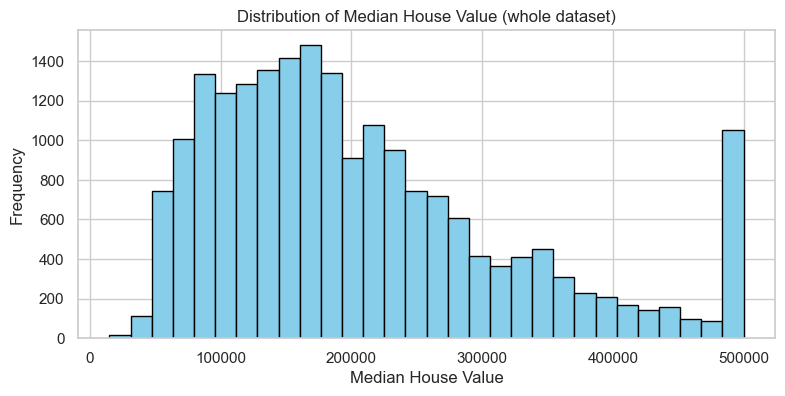

In [218]:
plt.figure(figsize=(9, 4))  # Set the size of the figure

# Plot a bar chart for the distribution of median_house_value
plt.hist(housing_df['median_house_value'], bins=30, color='skyblue', edgecolor='black')

plt.xlabel('Median House Value')
plt.ylabel('Frequency')
plt.title('Distribution of Median House Value (whole dataset)')
plt.grid(True)

# Show the plot
plt.show()

In [219]:
# Drop rows where median_house_value is greater than 499000
housing_df = housing_df[housing_df['median_house_value'] <= 499000]

### **1.3 Splitting the data into 3 parts**
As the provided data covers the whole housing market of California, US, we wanted to split the state into 3 parts.

This will help us to compare different variables across different regions of the state.

In [220]:
# Finding minimum and maximum latitude values
min_latitude = housing_df['latitude'].min()
max_latitude = housing_df['latitude'].max()

# Calculating split points for latitude (dividing into 3 equal parts)
latitude_range = max_latitude - min_latitude
latitude_split_points = [min_latitude + latitude_range / 3,
                         min_latitude + 2 * latitude_range / 3]

# Assigning data points to regions based on latitude
def assign_region(row):
    if row['latitude'] <= latitude_split_points[0]:
        return 'Southern'
    elif row['latitude'] <= latitude_split_points[1]:
        return 'Middle'
    else:
        return 'Northern'

# Applying the function to create a new column 'region'
housing_df['region'] = housing_df.apply(assign_region, axis=1)

# Now the dataframe has a new column 'region' indicating whether each data point is in Northern, Middle, or Southern California
# let's have a look at it:
housing_df

/var/folders/k4/qg_rhcgs63z83dk0wwghr6tc0000gn/T/ipykernel_56966/3142184122.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  housing_df['region'] = housing_df.apply(assign_region, axis=1)


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,region
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,Middle
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,Middle
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,Middle
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,Middle
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,Middle
...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND,Northern
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND,Northern
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND,Northern
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND,Northern


In [221]:
# Define a function to filter rows based on the "region" column
def filter_by_region(df, region):
    return df[df['region'] == region]

# Usage examples:
northern_data = filter_by_region(housing_df, "Northern")
middle_data = filter_by_region(housing_df, "Middle")
southern_data = filter_by_region(housing_df, "Southern")

**Checking if the datapoints were correctlly divided into 3 parts**

In order to check if the data is correctly split into three parts, we created a map:

In [222]:
# Creating a base map centered around California
california_map = folium.Map(location=[36.7783, -119.4179], zoom_start=6)

# Defining region colors
region_colors = {'Northern': 'orange', 'Middle': 'blue', 'Southern': 'red'}

# Plotting data points based on regions from housing_df DataFrame
for index, row in housing_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=region_colors.get(row['region'], 'gray'),  # Default to gray for unknown regions
        fill=True,
        fill_opacity=0.6
    ).add_to(california_map)

# Displaying the map (optional)
california_map

### **2.1 Sub-question Nr.1**

*tbd*
* H0:
* HA: 

In [223]:
import scipy.stats as stats

# Separate the data into three regions
northern_population = housing_df[housing_df['region'] == 'Northern']['population']
middle_population = housing_df[housing_df['region'] == 'Middle']['population']
southern_population = housing_df[housing_df['region'] == 'Southern']['population']

# Perform ANOVA test
f_statistic, p_value = stats.f_oneway(northern_population, middle_population, southern_population)

# Print the results
print("F-Statistic:", f_statistic)
print("P-Value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in population size across the three regions.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in population size across the three regions.")

F-Statistic: 172.44670997180535
P-Value: 5.805087451373065e-75
Reject the null hypothesis: There is a significant difference in population size across the three regions.


Shapiro-Wilk p-values for normality:
Northern Region: 5.279236319320719e-36
Middle Region: 0.0
Southern Region: 0.0

Levene's test p-value for homogeneity of variance: 2.0483567936578595e-22


/Users/carlhumbs/anaconda3/lib/python3.11/site-packages/scipy/stats/_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


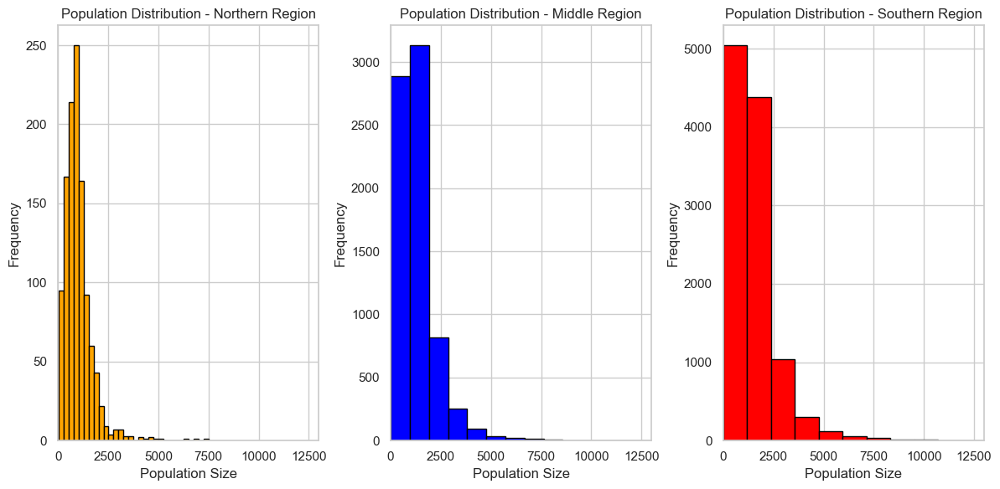

In [224]:
import scipy.stats as stats
import matplotlib.pyplot as plt

# Assumption 1: Normality
# Use Shapiro-Wilk test for normality
_, p_northern = stats.shapiro(northern_population)
_, p_middle = stats.shapiro(middle_population)
_, p_southern = stats.shapiro(southern_population)

print("Shapiro-Wilk p-values for normality:")
print("Northern Region:", p_northern)
print("Middle Region:", p_middle)
print("Southern Region:", p_southern)

# Assumption 2: Homogeneity of Variance
# Use Levene's test for homogeneity of variance
_, p_homogeneity = stats.levene(northern_population, middle_population, southern_population)

print("\nLevene's test p-value for homogeneity of variance:", p_homogeneity)

# Visualize data distributions for each region
# Calculate the maximum population size among all regions
max_population = max(max(northern_population), max(middle_population), max(southern_population))

# Set a common range for the x-axis
x_range = (0, 13000)

plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.hist(northern_population, bins=30, color='orange', edgecolor='black')
plt.title('Population Distribution - Northern Region')
plt.xlabel('Population Size')
plt.ylabel('Frequency')
plt.xlim(x_range)  # Set the x-axis range

plt.subplot(1, 3, 2)
plt.hist(middle_population, bins=30, color='blue', edgecolor='black')
plt.title('Population Distribution - Middle Region')
plt.xlabel('Population Size')
plt.ylabel('Frequency')
plt.xlim(x_range)  # Set the x-axis range

plt.subplot(1, 3, 3)
plt.hist(southern_population, bins=30, color='red', edgecolor='black')
plt.title('Population Distribution - Southern Region')
plt.xlabel('Population Size')
plt.ylabel('Frequency')
plt.xlim(x_range)  # Set the x-axis range

plt.tight_layout()
plt.show()

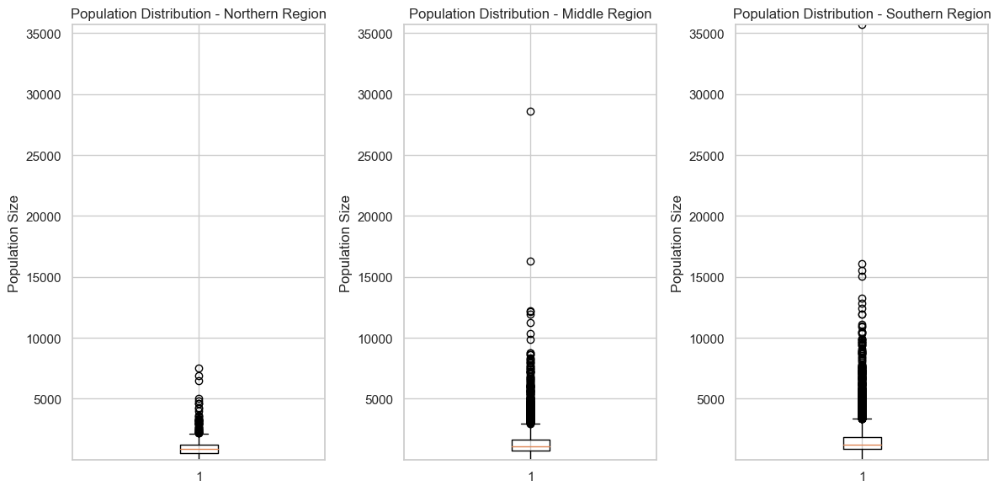

In [225]:
import matplotlib.pyplot as plt

# Visualize data distributions for each region with outliers using box plots
plt.figure(figsize=(12, 6))

# Calculate the global y-axis limits based on the original data
y_min_with_outliers = min(northern_population.min(), middle_population.min(), southern_population.min())
y_max_with_outliers = max(northern_population.max(), middle_population.max(), southern_population.max())

plt.subplot(1, 3, 1)
plt.boxplot(northern_population, showfliers=True)
plt.title('Population Distribution - Northern Region')
plt.ylabel('Population Size')
plt.ylim(y_min_with_outliers, y_max_with_outliers)  # Set y-axis limits

plt.subplot(1, 3, 2)
plt.boxplot(middle_population, showfliers=True)
plt.title('Population Distribution - Middle Region')
plt.ylabel('Population Size')
plt.ylim(y_min_with_outliers, y_max_with_outliers)  # Set y-axis limits

plt.subplot(1, 3, 3)
plt.boxplot(southern_population, showfliers=True)
plt.title('Population Distribution - Southern Region')
plt.ylabel('Population Size')
plt.ylim(y_min_with_outliers, y_max_with_outliers)  # Set y-axis limits

plt.tight_layout()
plt.show()


Shapiro-Wilk p-values for normality (without outliers):
Northern Region: 5.710270581035792e-13
Middle Region: 1.2656902605146924e-36
Southern Region: 0.0

Levene's test p-value for homogeneity of variance (without outliers): 1.2356235410795728e-38


/Users/carlhumbs/anaconda3/lib/python3.11/site-packages/scipy/stats/_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


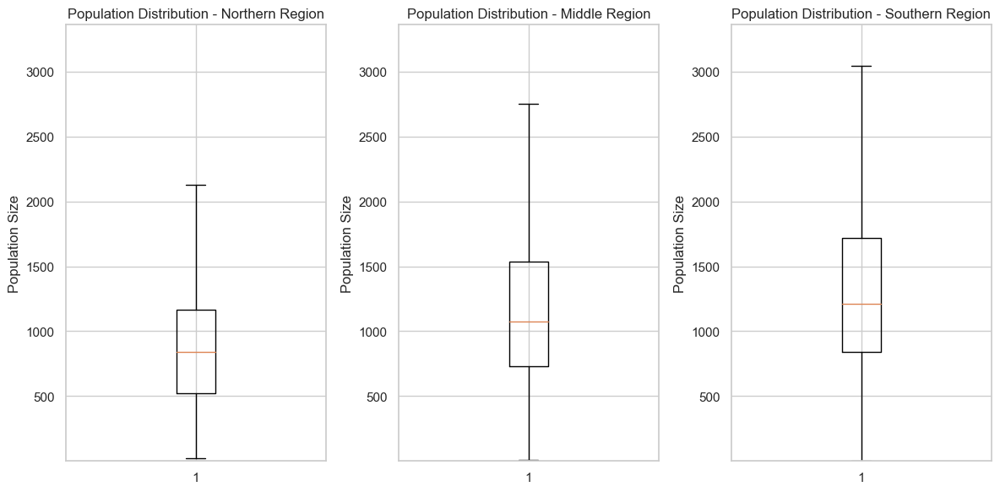

In [226]:
import scipy.stats as stats
import matplotlib.pyplot as plt

# Function to remove outliers using IQR method
def remove_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data[(data >= lower_bound) & (data <= upper_bound)]

# Remove outliers from population data for each region
filtered_northern_population = remove_outliers(northern_population)
filtered_middle_population = remove_outliers(middle_population)
filtered_southern_population = remove_outliers(southern_population)

# Assumption 1: Normality
# Use Shapiro-Wilk test for normality
_, p_northern = stats.shapiro(filtered_northern_population)
_, p_middle = stats.shapiro(filtered_middle_population)
_, p_southern = stats.shapiro(filtered_southern_population)

print("Shapiro-Wilk p-values for normality (without outliers):")
print("Northern Region:", p_northern)
print("Middle Region:", p_middle)
print("Southern Region:", p_southern)

# Assumption 2: Homogeneity of Variance
# Use Levene's test for homogeneity of variance
_, p_homogeneity = stats.levene(filtered_northern_population, filtered_middle_population, filtered_southern_population)

print("\nLevene's test p-value for homogeneity of variance (without outliers):", p_homogeneity)

# Visualize data distributions for each region without outliers using box plots
plt.figure(figsize=(12, 6))

# Calculate the global y-axis limits based on the filtered data
y_min = min(filtered_northern_population.min(), filtered_middle_population.min(), filtered_southern_population.min())
y_max = max(filtered_northern_population.max(), filtered_middle_population.max(), filtered_southern_population.max())

plt.subplot(1, 3, 1)
plt.boxplot(filtered_northern_population, showfliers=False)
plt.title('Population Distribution - Northern Region')
plt.ylabel('Population Size')
plt.ylim(y_min, y_max)  # Set y-axis limits

plt.subplot(1, 3, 2)
plt.boxplot(filtered_middle_population, showfliers=False)
plt.title('Population Distribution - Middle Region')
plt.ylabel('Population Size')
plt.ylim(y_min, y_max)  # Set y-axis limits

plt.subplot(1, 3, 3)
plt.boxplot(filtered_southern_population, showfliers=False)
plt.title('Population Distribution - Southern Region')
plt.ylabel('Population Size')
plt.ylim(y_min, y_max)  # Set y-axis limits

plt.tight_layout()
plt.show()

The Shapiro-Wilk test is used to assess whether a given dataset follows a normal distribution. In your case, the calculated p-values for the Northern, Middle, and Southern regions are extremely small (close to zero), indicating that the population data for all three regions are not normally distributed. 

When interpreting the results of the Shapiro-Wilk test:

- If the p-value is less than the chosen significance level (commonly 0.05), you reject the null hypothesis. In this context, a small p-value indicates that the data significantly deviate from a normal distribution.
- If the p-value is greater than 0.05, you fail to reject the null hypothesis, suggesting that there is no significant evidence to conclude that the data do not follow a normal distribution.

Given the very small p-values in your results, it seems reasonable to assume that the population data for the Northern, Middle, and Southern regions do not follow a normal distribution. This is an important consideration when selecting appropriate statistical tests for further analysis, as certain tests (such as ANOVA) assume normality of the data. In cases where normality assumptions are violated, non-parametric tests or transformations of the data might be more appropriate.

<Figure size 1200x800 with 0 Axes>

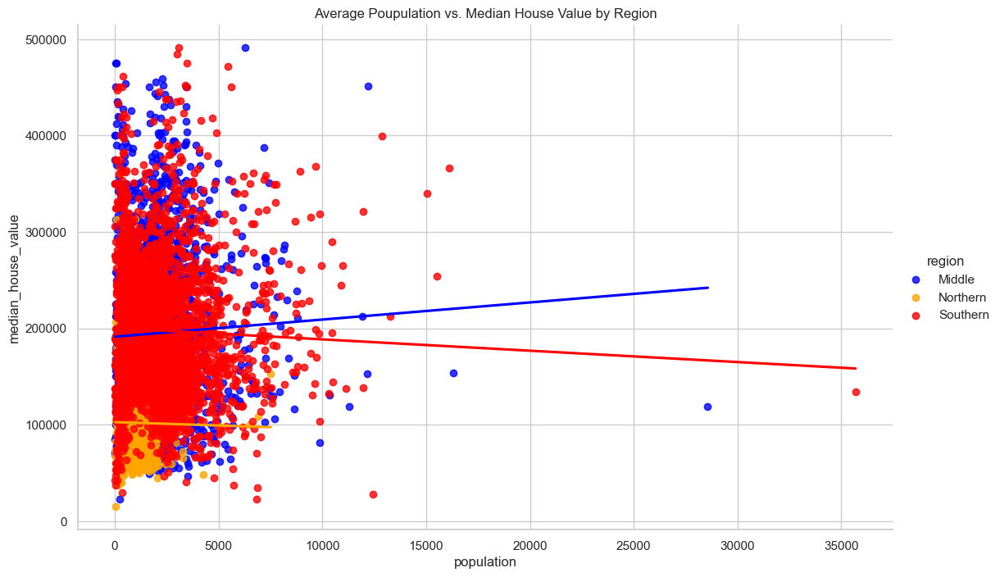

In [227]:
# Calculate average values for median_housing_value and population_size across the three regions
average_values = housing_df.groupby(['region', 'population']).median_house_value.mean().reset_index()

plt.figure(figsize=(12, 8))
sns.lmplot(x='population', y='median_house_value', hue='region', data=average_values, height=7, aspect=1.6, ci=None, palette={'Northern': 'orange', 'Middle': 'blue', 'Southern': 'red'})
plt.title('Average Poupulation vs. Median House Value by Region')
plt.show()

<Figure size 1000x600 with 0 Axes>

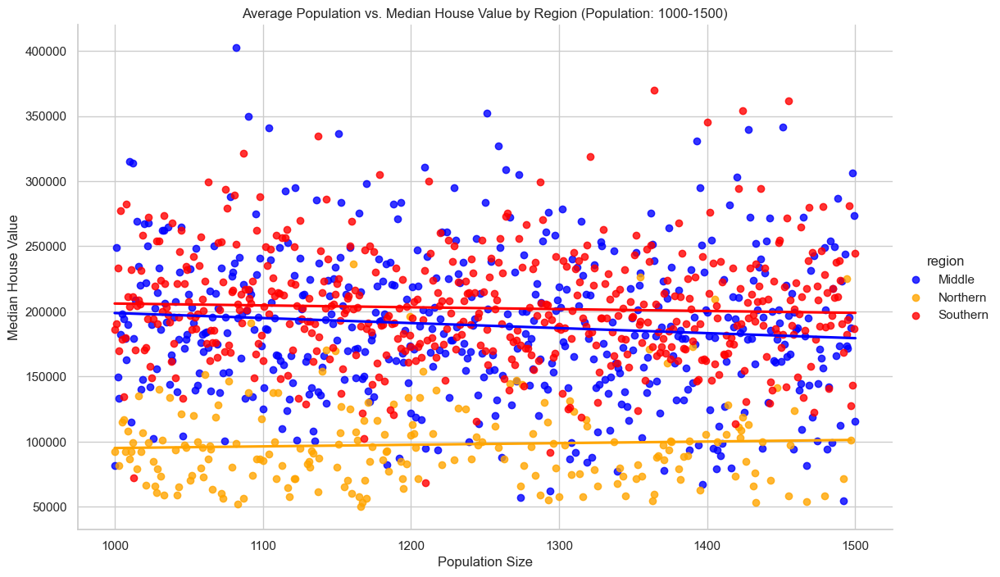

In [228]:
# Calculate average values for median_housing_value and population_size across the three regions
average_values = housing_df.groupby(['region', 'population']).median_house_value.mean().reset_index()

# Filter data points where population is in the range of 1000 to 1500
filtered_data = average_values[(average_values['population'] >= 1000) & (average_values['population'] <= 1500)]

# Create scatter plot for the filtered data
plt.figure(figsize=(10, 6))
sns.lmplot(x='population', y='median_house_value', hue='region', data=filtered_data, height=7, aspect=1.6, ci=None, palette={'Northern': 'orange', 'Middle': 'blue', 'Southern': 'red'})
plt.title('Average Population vs. Median House Value by Region (Population: 1000-1500)')
plt.xlabel('Population Size')
plt.ylabel('Median House Value')
plt.show()